### Problem Statement:
Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate
market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market
and there are various companies working in the domain. Data science comes as a very important tool to solve problems
in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and
focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling,
recommendation systems are some of the machine learning techniques used for achieving the business goals for housing
companies. Our problem is related to one such housing company.
A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses
data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same
purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file
below.
The company is looking at prospective properties to buy houses to enter the market. You are required to build a model
using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest
in them or not. For this company wants to know:
• Which variables are important to predict the price of variable?
• How do these variables describe the price of the house?

### Business Goal:

You are required to model the price of houses with the available independent variables. This model will then be used
by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the
strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for the
management to understand the pricing dynamics of a new market.

### Technical Requirements:

Data contains 1460 entries each having 81 variables.

• Data contains Null values. You need to treat them using the domain knowledge and your own understanding.

• Extensive EDA has to be performed to gain relationships of important variable and price.

• Data contains numerical as well as categorical variable. You need to handle them accordingly.

• You have to build Machine Learning models, apply regularization and determine the optimal values of Hyper
Parameters.

• You need to find important features which affect the price positively or negatively.
• Two datasets are being provided to you (test.csv, train.csv). You will train on train.csv dataset and predict on
test.csv file.


In [1]:
from pickle import Unpickler as Upck
import pandas as pd
import numpy as np

import klib
import sweetviz

import matplotlib.pyplot as plt
import time
import seaborn as sns


import warnings
warnings.filterwarnings("ignore")

# Let’s load the Dataset into a Pandas data frame:

In [2]:
df_train = pd.read_csv(r'https://raw.githubusercontent.com/swrrocky17/Internship/main/Machine%20Learning/train.csv')
df_test = pd.read_csv(r'https://raw.githubusercontent.com/swrrocky17/Internship/main/Machine%20Learning/test.csv')
y = df_train[['SalePrice']]
idx_test = df_test[['Id']]

In [3]:
df_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


<AxesSubplot:xlabel='SalePrice', ylabel='Count'>

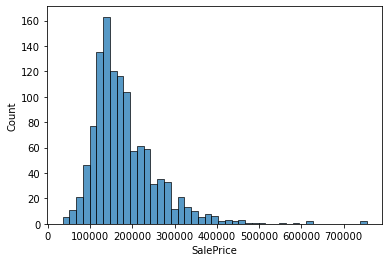

In [4]:
sns.histplot(df_train['SalePrice'])

Most of the density lies between 100k and 250k, but there appears to be a lot of outliers on the pricier side.

<AxesSubplot:xlabel='OverallQual', ylabel='SalePrice'>

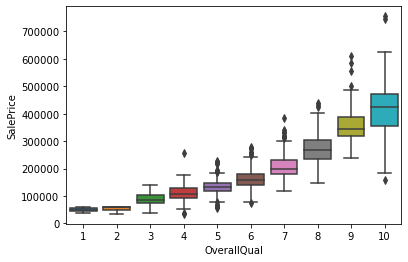

In [6]:
sns.boxplot(df_train['OverallQual'],df_train['SalePrice'])

Everything seems fine for this one, except that when you look to the right things start getting much more nuanced.

<AxesSubplot:xlabel='BedroomAbvGr', ylabel='SalePrice'>

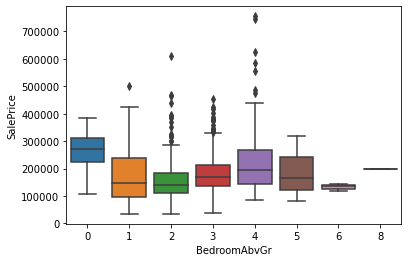

In [7]:
sns.boxplot(df_train['BedroomAbvGr'],df_train['SalePrice'])

# Analyse a single Dataframe

In [8]:
my_report=sweetviz.analyze([df_train,"Train"],target_feat='SalePrice')

                                             |                                             | [  0%]   00:00 ->…


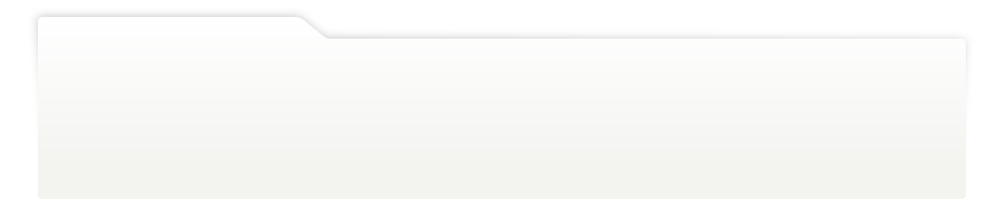
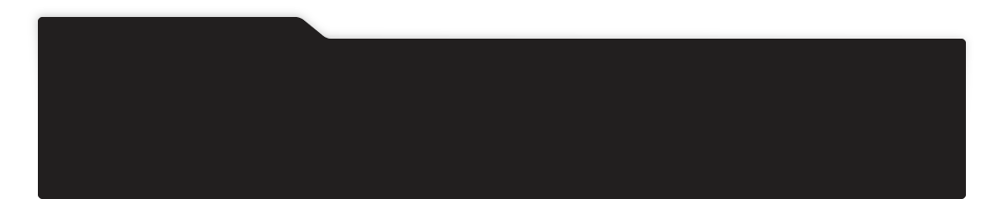
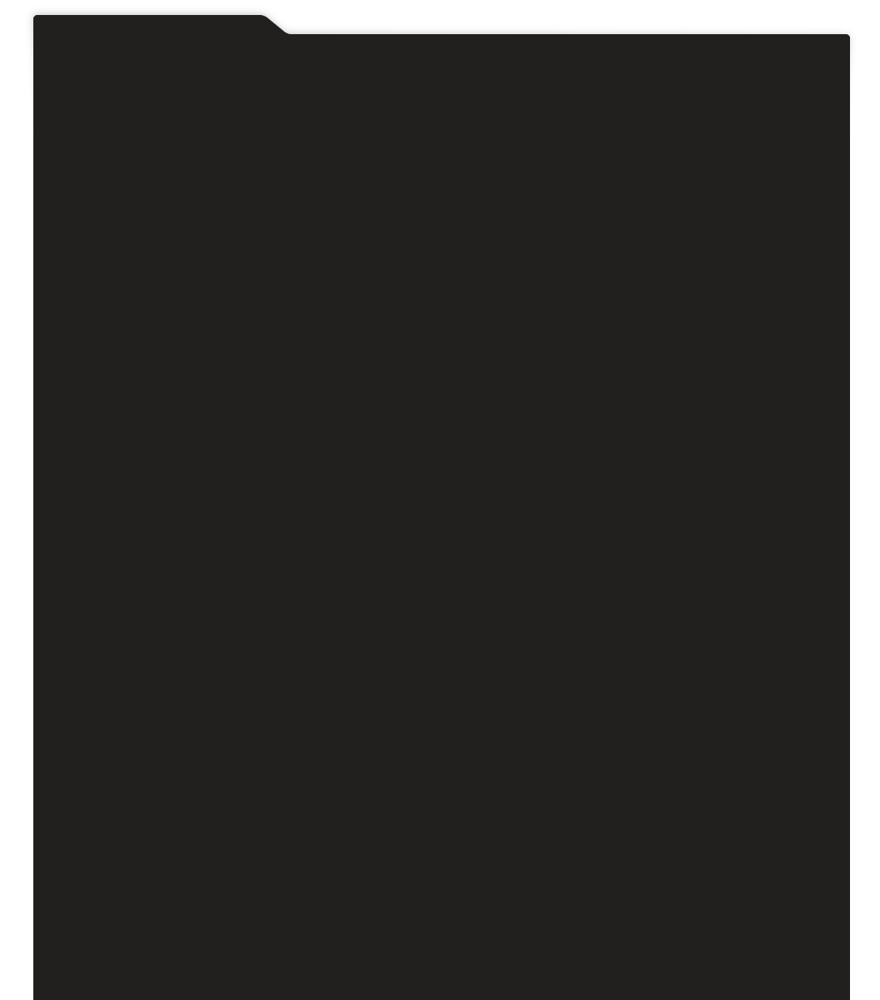
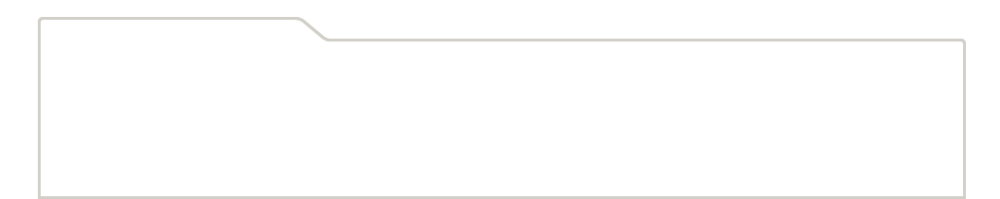
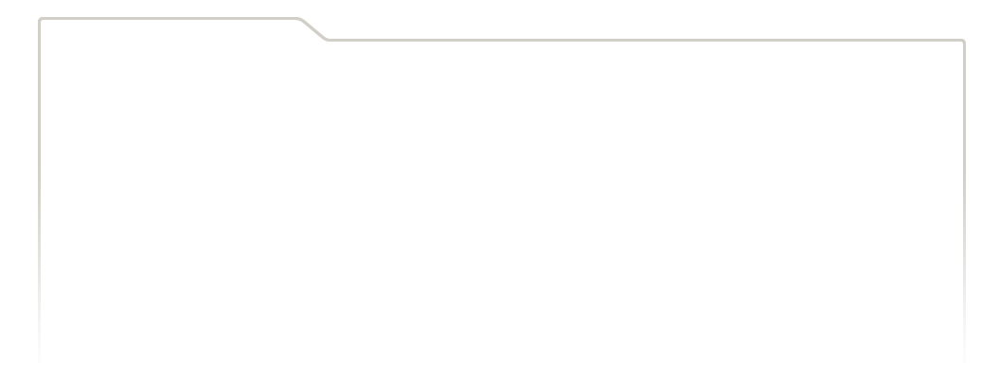
...
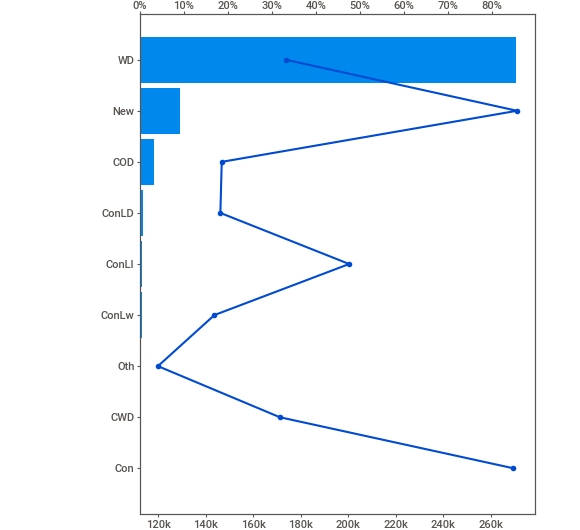
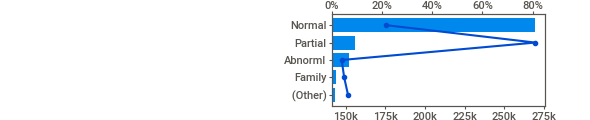
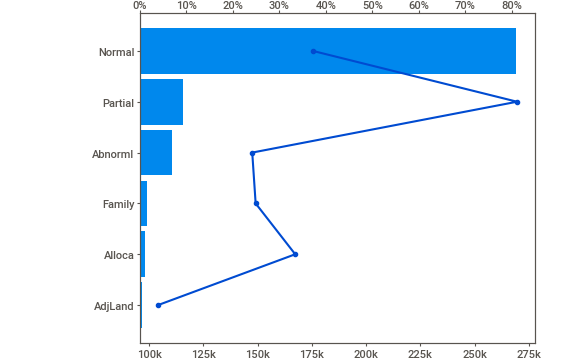
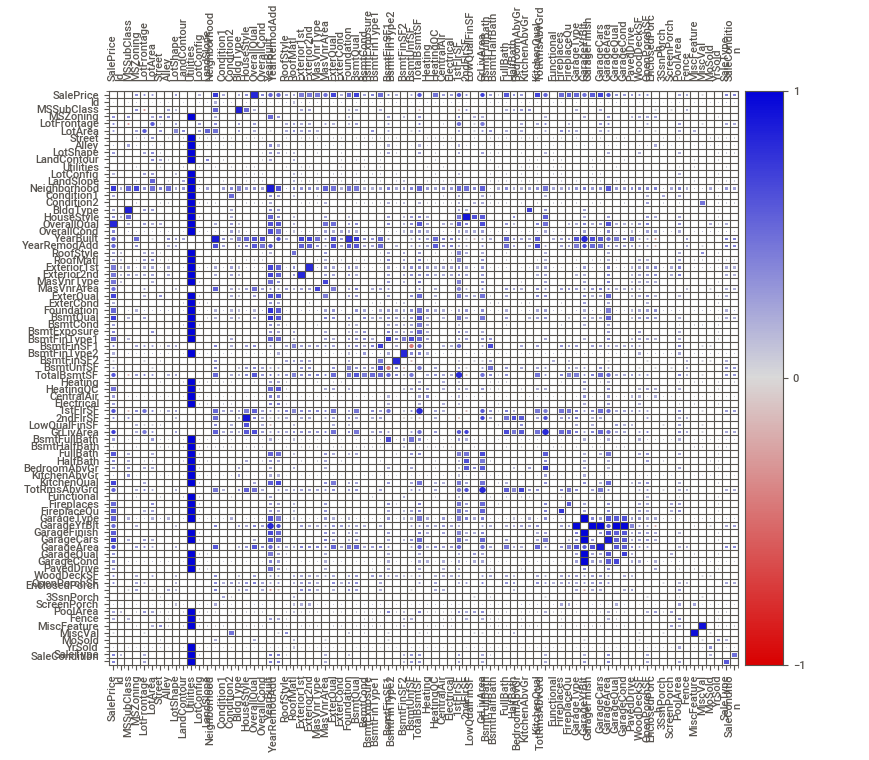
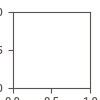

In [9]:
my_report.show_notebook()

In [14]:
df_test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,...,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,...,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal


# Compaire two Dataframes (Test vs Train)

In [15]:
my_report1=sweetviz.compare([df_train,"Train"],[df_test,"Test"],target_feat='SalePrice')

                                             |                                             | [  0%]   00:00 ->…


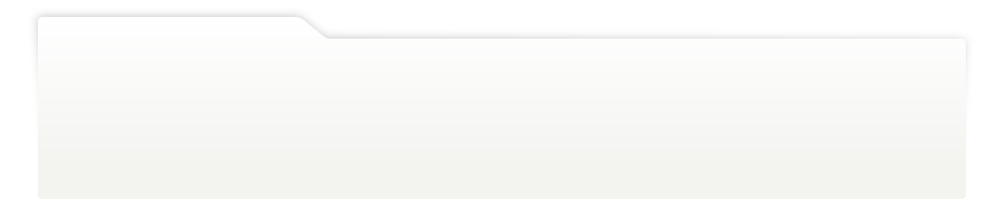
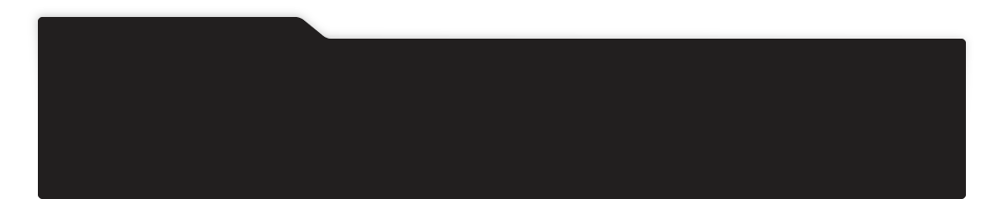
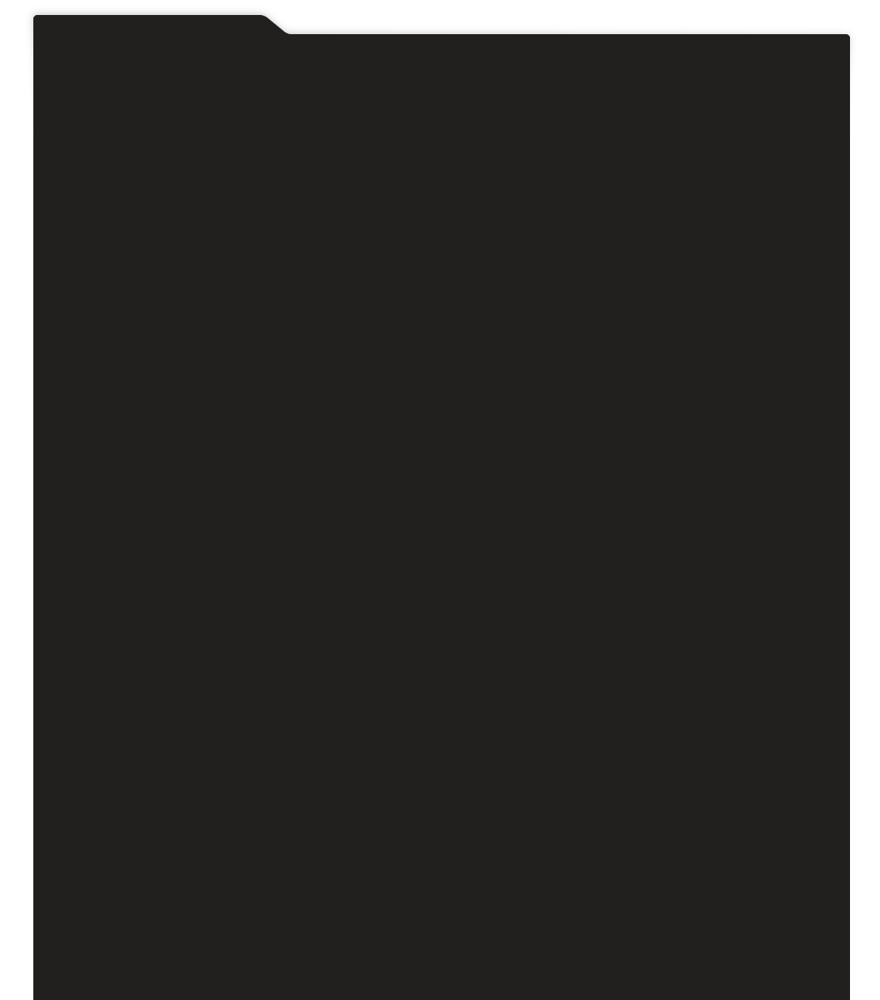
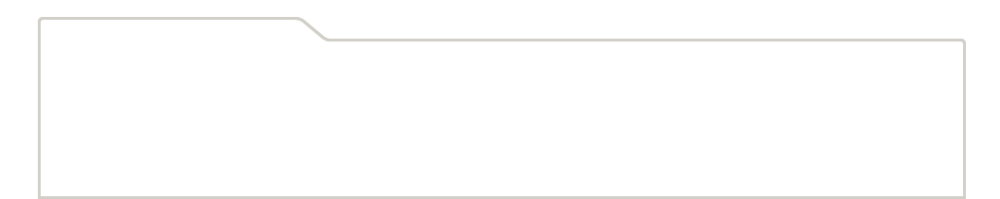
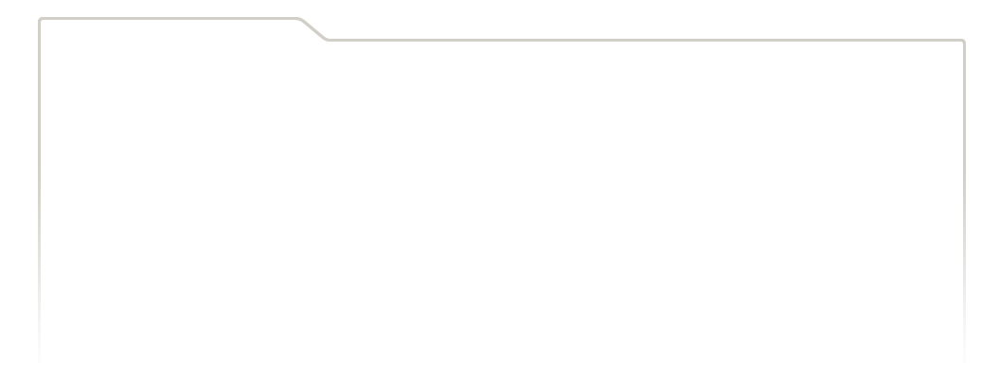
...
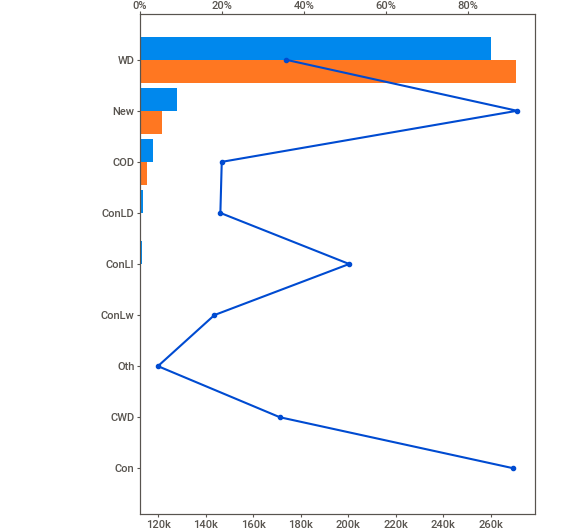
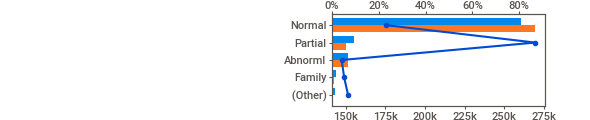
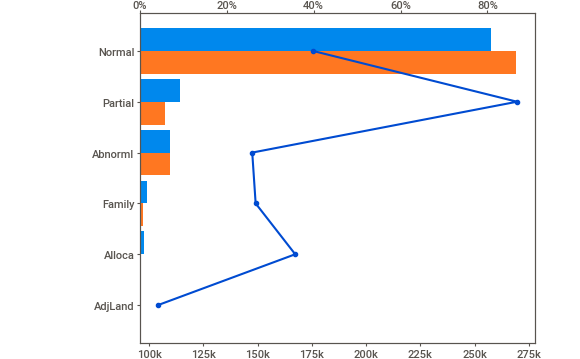
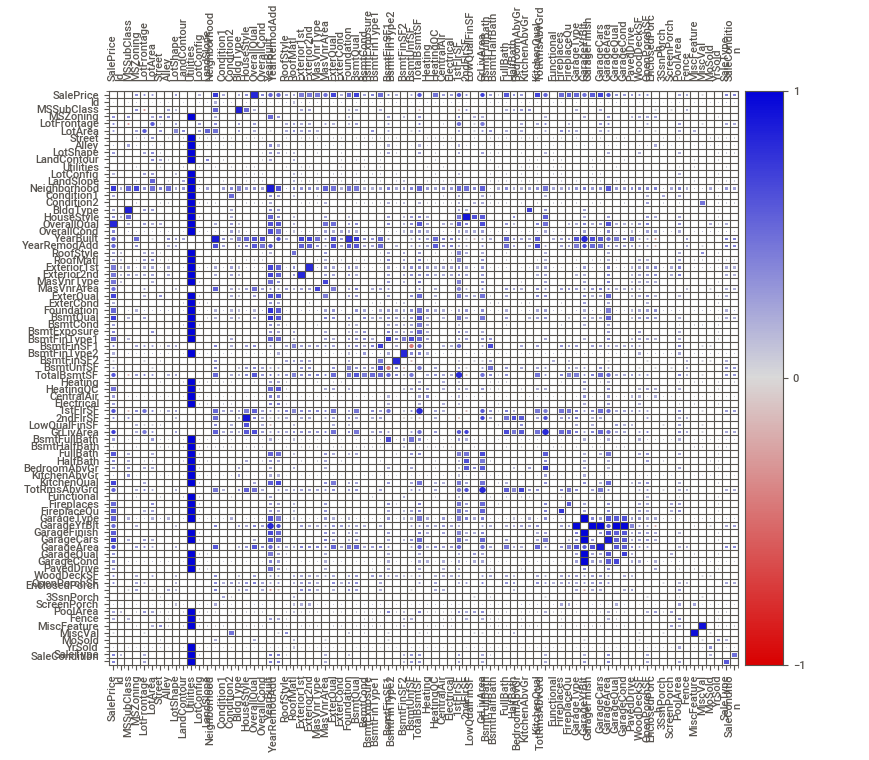
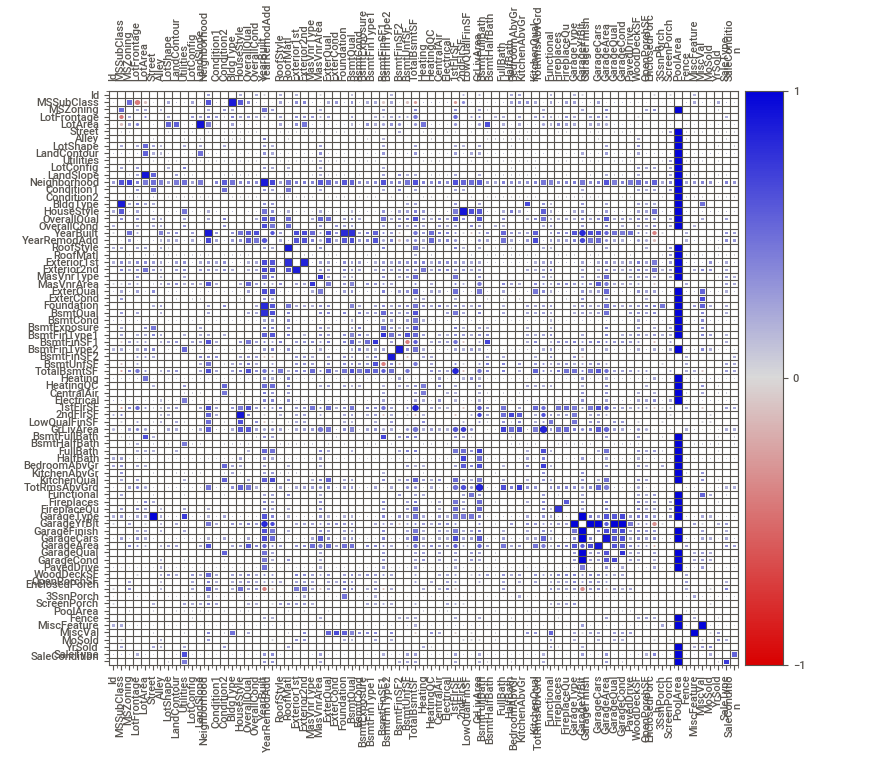

In [16]:
my_report1.show_notebook()

In [17]:
print('df_train: ', df_train.shape)
print('df_test: ', df_test.shape)

df_train:  (1168, 81)
df_test:  (292, 80)


<AxesSubplot:>

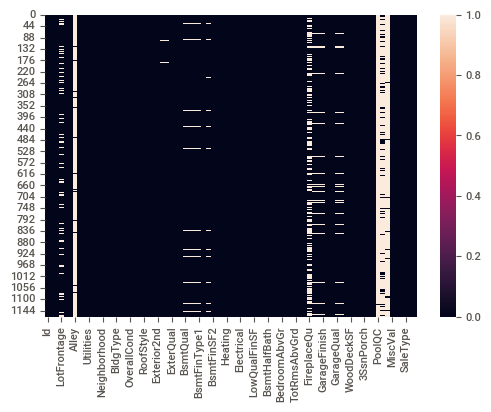

In [18]:
sns.heatmap(df_train.isnull())

In [19]:
df_train.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
                  ...   
MoSold             int64
YrSold             int64
SaleType          object
SaleCondition     object
SalePrice          int64
Length: 81, dtype: object

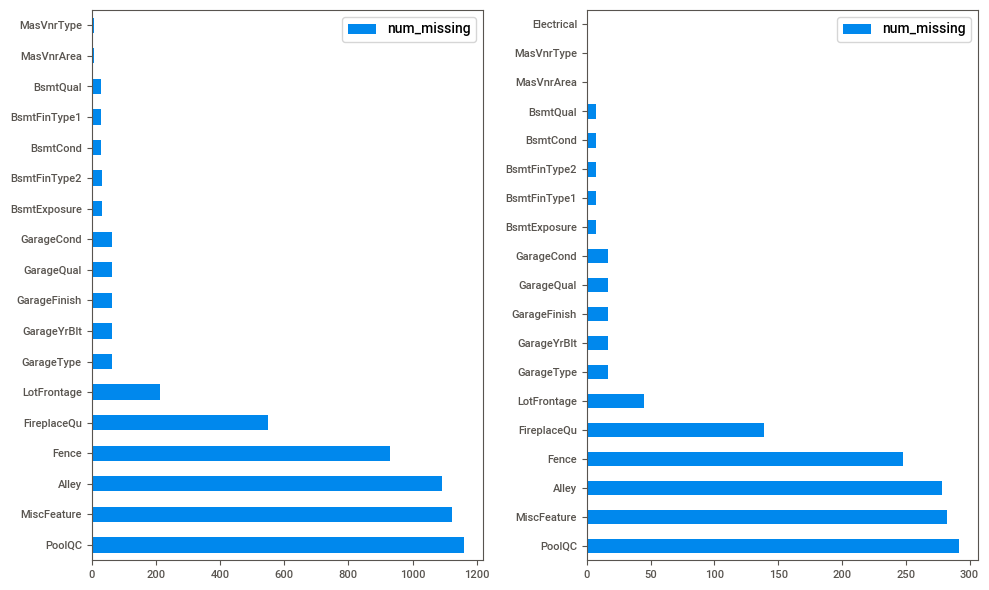

In [20]:
# Check for missing values in train & test sets.
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2)
df_train.isnull().sum().to_frame(name='num_missing').query('num_missing>0').sort_values(by='num_missing', ascending=False).plot.barh(ax=ax1, figsize=(10,6));
df_test.isnull().sum().to_frame(name='num_missing').query('num_missing>0').sort_values(by='num_missing', ascending=False).plot.barh(ax=ax2, figsize=(10,6));
plt.tight_layout()

In [21]:
# pivot table for the missing values
total = df_train.isnull().sum().sort_values(ascending=False)
percentage = (df_train.isnull().sum()/df_train.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percentage], axis=1, keys=['Total', 'Percentage'])
missing_data.head(20)

,Total,Percentage
PoolQC,1161,0.994007
MiscFeature,1124,0.962329
Alley,1091,0.934075
Fence,931,0.797089
FireplaceQu,551,0.471747
LotFrontage,214,0.183219
GarageYrBlt,64,0.054795
GarageFinish,64,0.054795
GarageType,64,0.054795
GarageQual,64,0.054795


In [22]:
#select numeric columns 
train_data_numeric=df_train.select_dtypes(include=[np.number])
numeric_cols=train_data_numeric.columns.values
print(numeric_cols)
print(len(numeric_cols))

['Id' 'MSSubClass' 'LotFrontage' 'LotArea' 'OverallQual' 'OverallCond'
 'YearBuilt' 'YearRemodAdd' 'MasVnrArea' 'BsmtFinSF1' 'BsmtFinSF2'
 'BsmtUnfSF' 'TotalBsmtSF' '1stFlrSF' '2ndFlrSF' 'LowQualFinSF'
 'GrLivArea' 'BsmtFullBath' 'BsmtHalfBath' 'FullBath' 'HalfBath'
 'BedroomAbvGr' 'KitchenAbvGr' 'TotRmsAbvGrd' 'Fireplaces' 'GarageYrBlt'
 'GarageCars' 'GarageArea' 'WoodDeckSF' 'OpenPorchSF' 'EnclosedPorch'
 '3SsnPorch' 'ScreenPorch' 'PoolArea' 'MiscVal' 'MoSold' 'YrSold'
 'SalePrice']
38


In [23]:
#select non numeric columns
train_data_non_numeric = df_train.select_dtypes(exclude=[np.number])
non_numeric_cols=train_data_non_numeric.columns.values
print(non_numeric_cols)
print(len(non_numeric_cols))

['MSZoning' 'Street' 'Alley' 'LotShape' 'LandContour' 'Utilities'
 'LotConfig' 'LandSlope' 'Neighborhood' 'Condition1' 'Condition2'
 'BldgType' 'HouseStyle' 'RoofStyle' 'RoofMatl' 'Exterior1st'
 'Exterior2nd' 'MasVnrType' 'ExterQual' 'ExterCond' 'Foundation'
 'BsmtQual' 'BsmtCond' 'BsmtExposure' 'BsmtFinType1' 'BsmtFinType2'
 'Heating' 'HeatingQC' 'CentralAir' 'Electrical' 'KitchenQual'
 'Functional' 'FireplaceQu' 'GarageType' 'GarageFinish' 'GarageQual'
 'GarageCond' 'PavedDrive' 'PoolQC' 'Fence' 'MiscFeature' 'SaleType'
 'SaleCondition']
43


In [24]:
# values.count() per feature
# we can see that many feature contains almost times the same value
# this kind of feature is useless for any model
count=0
for col in df_train:
    if df_train[col].dtypes == 'object':
      print(df_train[col].value_counts(), '\n')
      count=count+1
      print(count)

RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64 

1
Pave    1164
Grvl       4
Name: Street, dtype: int64 

2
Grvl    41
Pave    36
Name: Alley, dtype: int64 

3
Reg    740
IR1    390
IR2     32
IR3      6
Name: LotShape, dtype: int64 

4
Lvl    1046
Bnk      50
HLS      42
Low      30
Name: LandContour, dtype: int64 

5
AllPub    1168
Name: Utilities, dtype: int64 

6
Inside     842
Corner     222
CulDSac     69
FR2         33
FR3          2
Name: LotConfig, dtype: int64 

7
Gtl    1105
Mod      51
Sev      12
Name: LandSlope, dtype: int64 

8
NAmes      182
CollgCr    118
OldTown     86
Edwards     83
Somerst     68
Gilbert     64
NridgHt     61
Sawyer      60
NWAmes      59
SawyerW     51
BrkSide     50
Crawfor     45
NoRidge     35
Mitchel     34
IDOTRR      30
Timber      24
ClearCr     24
SWISU       21
StoneBr     19
Blmngtn     15
BrDale      11
MeadowV      9
Veenker      9
NPkVill      8
Blueste      2
Name: Neighborhood,

In [25]:
df_raw = pd.concat([df_train, df_test])

In [26]:
df_raw

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000.0
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000.0
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790.0
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000.0
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,83,20,RL,78.0,10206,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2008,WD,Normal,NaN
288,1048,20,RL,57.0,9245,Pave,NaN,IR2,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,NaN
289,17,20,RL,NaN,11241,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,Shed,700,3,2010,WD,Normal,NaN
290,523,50,RM,50.0,5000,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2006,WD,Normal,NaN


<AxesSubplot:title={'center':'Feature-correlation (pearson)'}>

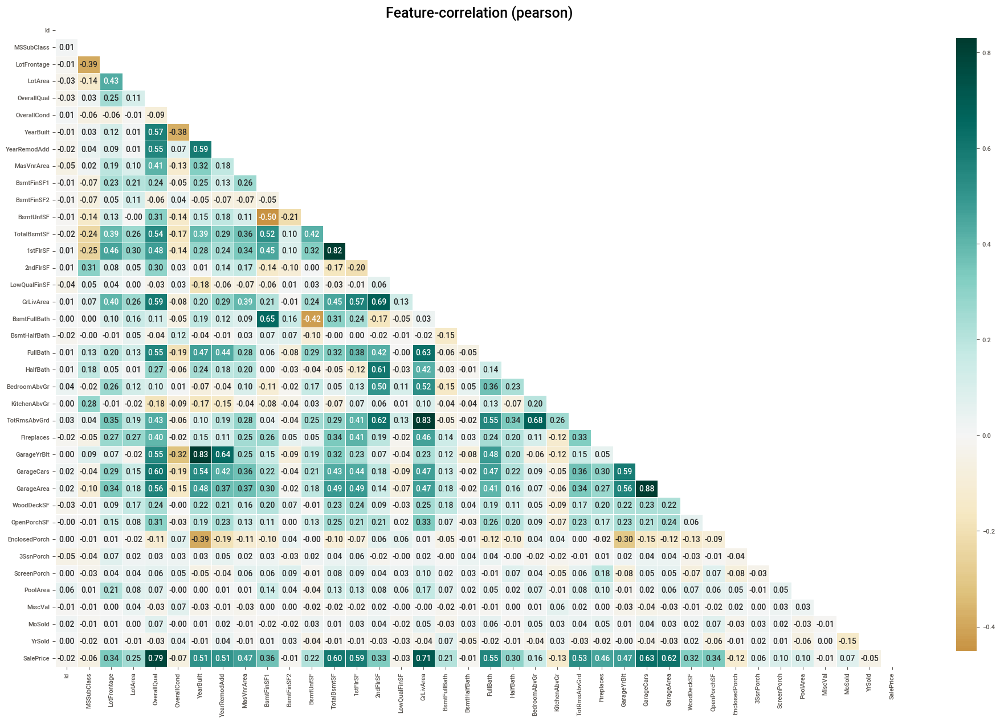

In [27]:
klib.corr_plot(df_raw,figsize=(24,15))

Note: The number of non binary numerical features is very large (32), please consider splitting the data. Showing plots for the first 20 numerical features. Override this by setting showall=True.


<AxesSubplot:xlabel='TotRmsAbvGrd', ylabel='Density'>

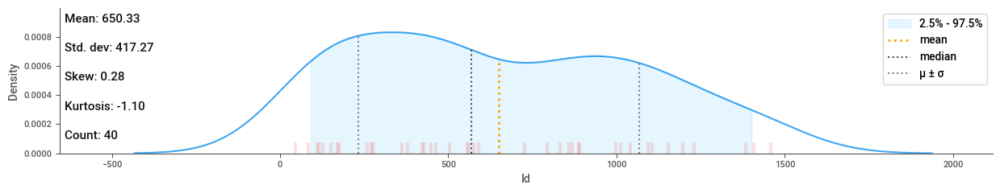

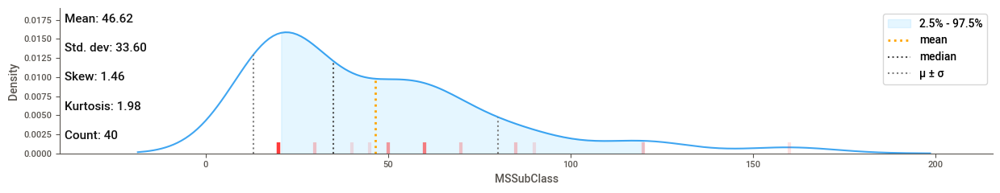

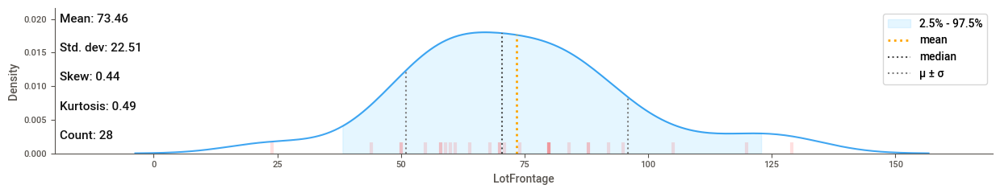

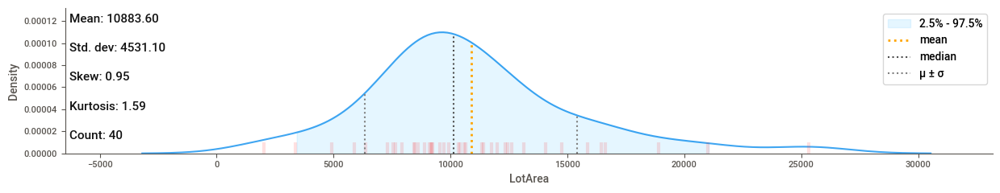

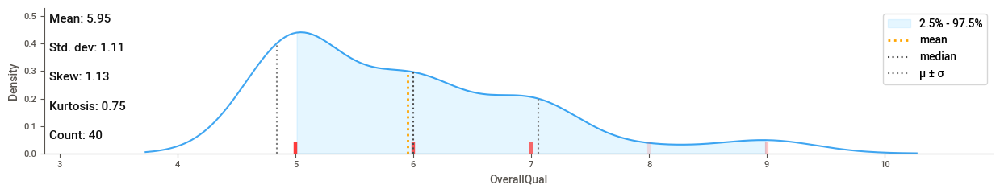

...

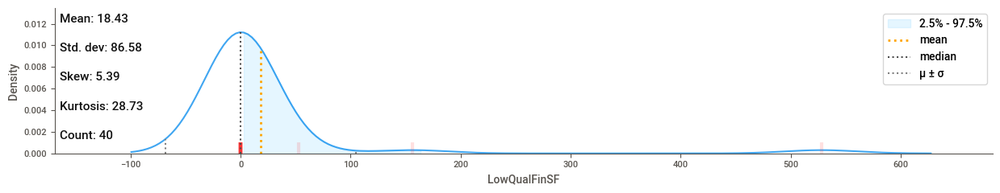

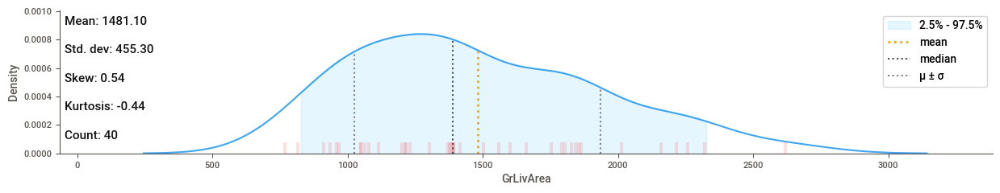

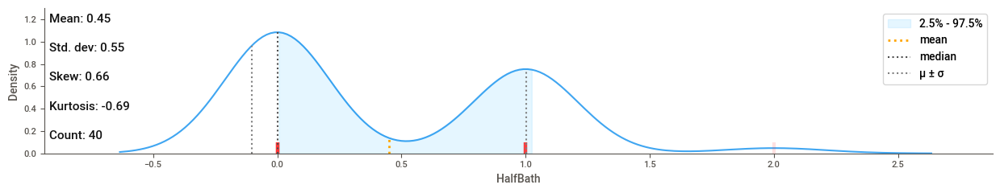

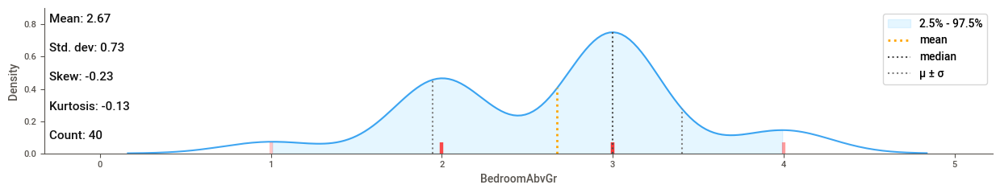

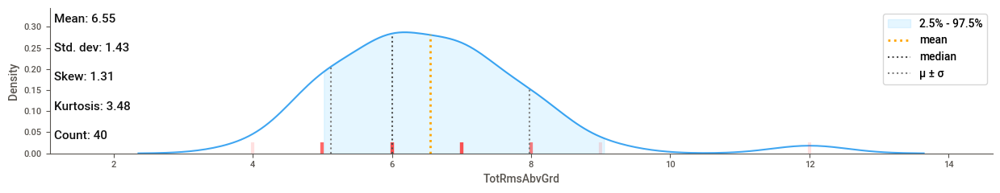

In [28]:
klib.dist_plot(df_raw[0:40])

Note: The number of non binary numerical features is very large (33), please consider splitting the data. Showing plots for the first 20 numerical features. Override this by setting showall=True.


<AxesSubplot:xlabel='TotRmsAbvGrd', ylabel='Density'>

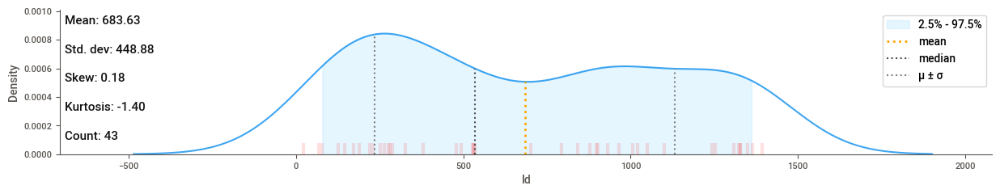

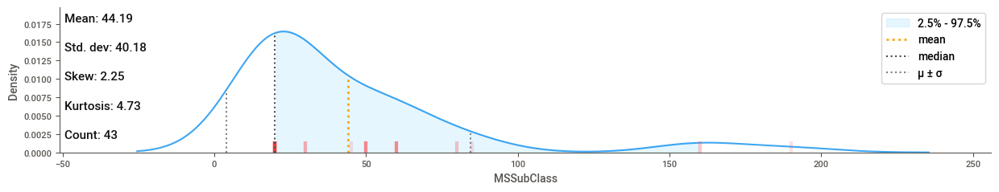

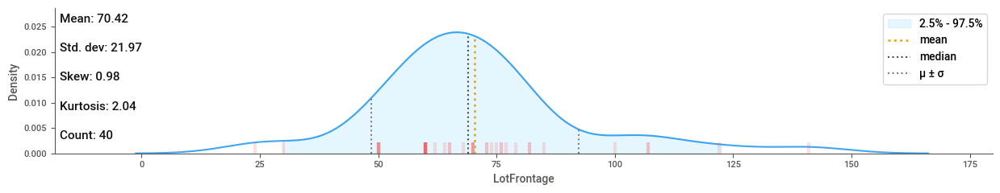

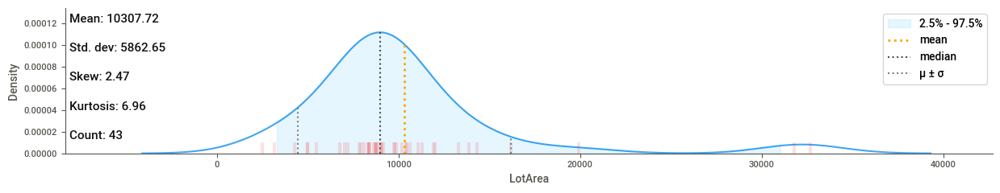

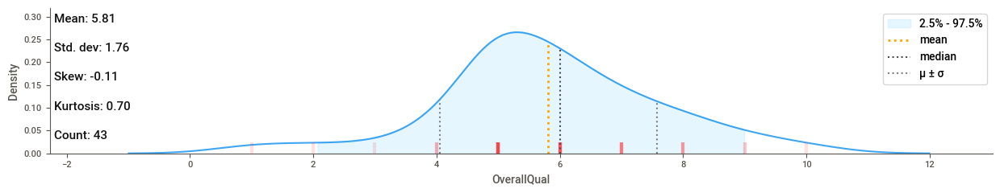

...

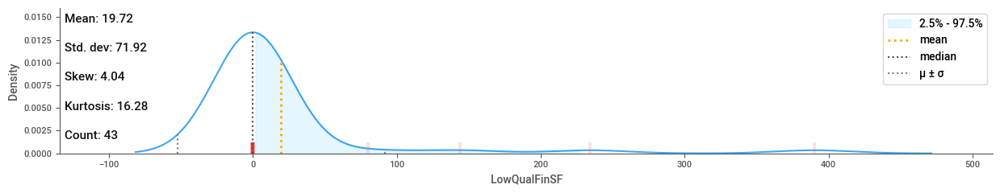

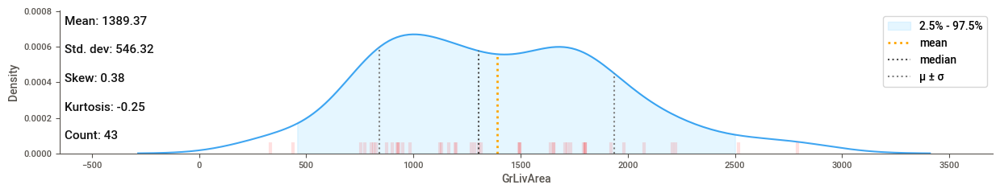

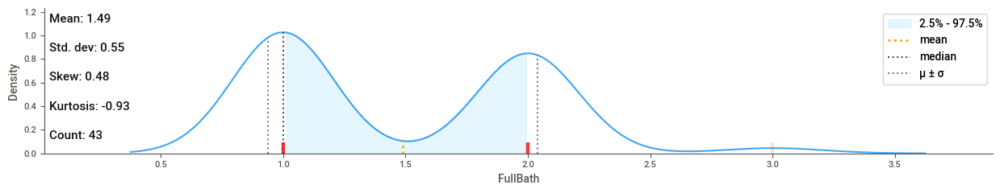

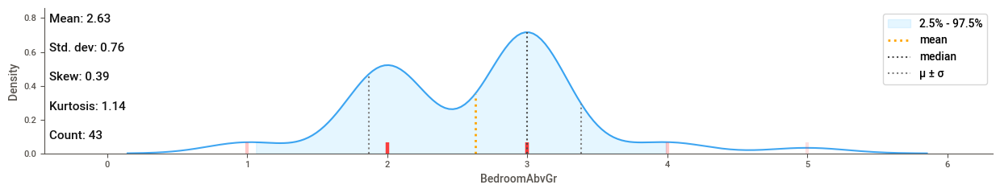

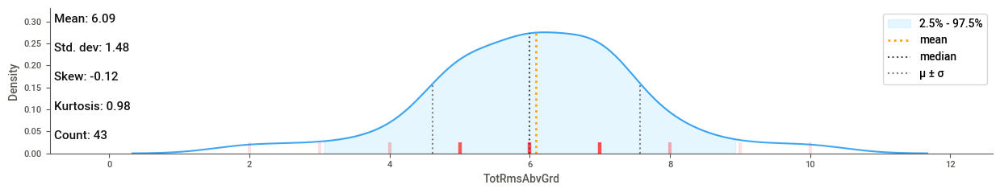

In [29]:
klib.dist_plot(df_raw[40:83])

GridSpec(6, 6)

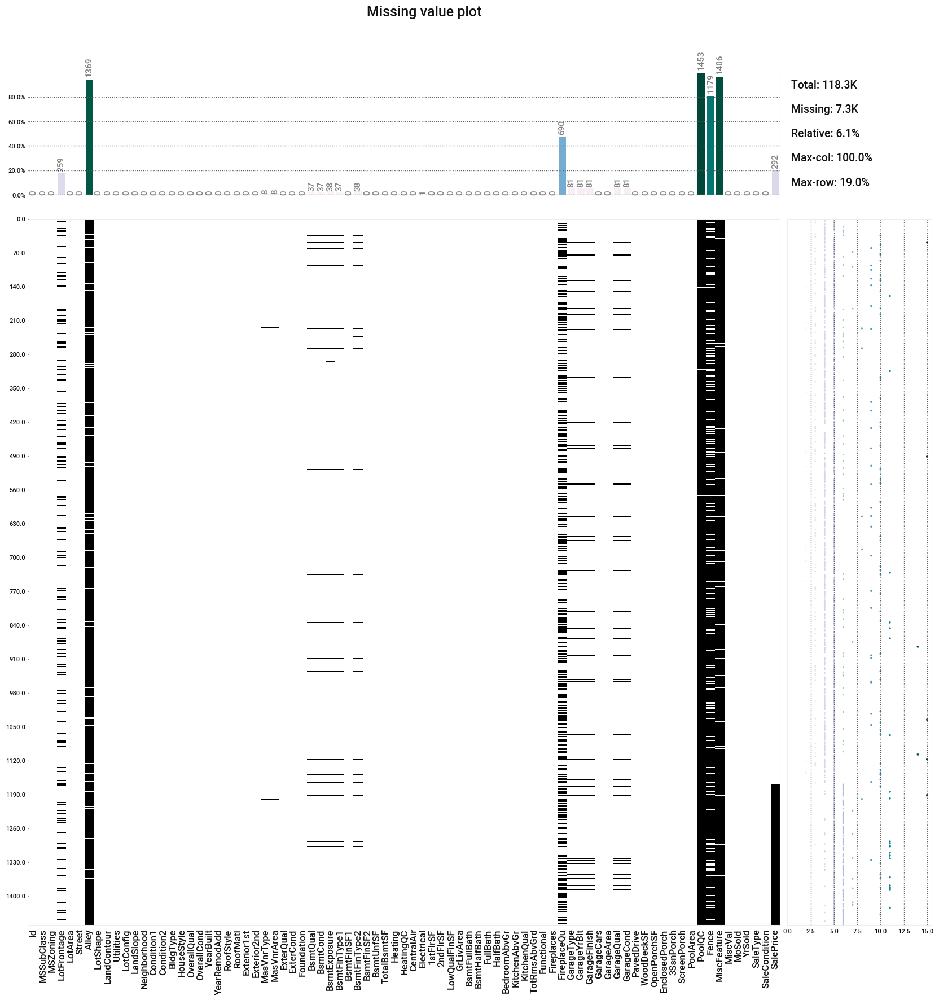

In [30]:
klib.missingval_plot(df_raw)

In [31]:
klib.data_cleaning(df_raw)

Shape of cleaned data: (1460, 78)Remaining NAs: 3029

Changes:
Dropped rows: 0
     of which 0 duplicates. (Rows: [])
Dropped columns: 3
     of which 0 single valued.     Columns: []
Dropped missing values: 4228
Reduced memory by at least: 0.77 MB (-81.91%)



,id,mssub_class,mszoning,lot_frontage,lot_area,street,lot_shape,land_contour,utilities,lot_config,...,3ssn_porch,screen_porch,pool_area,fence,misc_val,mo_sold,yr_sold,sale_type,sale_condition,sale_price
0,127,120,RL,<NA>,4928,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,NaN,0,2,2007,WD,Normal,128000.0
1,889,20,RL,95.0,15865,Pave,IR1,Lvl,AllPub,Inside,...,0,224,0,NaN,0,10,2007,WD,Normal,268000.0
2,793,60,RL,92.0,9920,Pave,IR1,Lvl,AllPub,CulDSac,...,0,0,0,NaN,0,6,2007,WD,Normal,269790.0
3,110,20,RL,105.0,11751,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,MnPrv,0,1,2010,COD,Normal,190000.0
4,422,20,RL,<NA>,16635,Pave,IR1,Lvl,AllPub,FR2,...,0,0,0,NaN,0,6,2009,WD,Normal,215000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,83,20,RL,78.0,10206,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,NaN,0,10,2008,WD,Normal,<NA>
1456,1048,20,RL,57.0,9245,Pave,IR2,Lvl,AllPub,Inside,...,0,0,0,NaN,0,2,2008,WD,Normal,<NA>
1457,17,20,RL,<NA>,11241,Pave,IR1,Lvl,AllPub,CulDSac,...,0,0,0,NaN,700,3,2010,WD,Normal,<NA>
1458,523,50,RM,50.0,5000,Pave,Reg,Lvl,AllPub,Corner,...,0,0,0,NaN,0,10,2006,WD,Normal,<NA>


In [32]:
df_raw.drop(['Id'], axis = 1, inplace = True)

In [33]:
df_raw['Age'] = df_raw['YrSold'] - df_raw['YearBuilt']

In [34]:
df_raw.drop(['YrSold','YearBuilt'], axis = 1, inplace = True)

In [35]:
# pivot table for the missing values
total = df_raw.isnull().sum().sort_values(ascending=False)
percentage = (df_raw.isnull().sum()/df_raw.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percentage], axis=1, keys=['Total', 'Percentage'])
missing_data.head(20)

,Total,Percentage
PoolQC,1453,0.995205
MiscFeature,1406,0.963014
Alley,1369,0.937671
Fence,1179,0.807534
FireplaceQu,690,0.472603
SalePrice,292,0.200000
LotFrontage,259,0.177397
GarageQual,81,0.055479
GarageCond,81,0.055479
GarageFinish,81,0.055479


In [36]:
df_raw.drop(['PoolQC','MiscFeature','Alley','Fence','FireplaceQu'], axis = 1, inplace = True)

In [37]:
df_raw

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SaleType,SaleCondition,SalePrice,Age
0,120,RL,NaN,4928,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,2,WD,Normal,128000.0,31
1,20,RL,95.0,15865,Pave,IR1,Lvl,AllPub,Inside,Mod,...,0,0,224,0,0,10,WD,Normal,268000.0,37
2,60,RL,92.0,9920,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,...,0,0,0,0,0,6,WD,Normal,269790.0,11
3,20,RL,105.0,11751,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,1,COD,Normal,190000.0,33
4,20,RL,NaN,16635,Pave,IR1,Lvl,AllPub,FR2,Gtl,...,0,0,0,0,0,6,WD,Normal,215000.0,32
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,20,RL,78.0,10206,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,10,WD,Normal,NaN,1
288,20,RL,57.0,9245,Pave,IR2,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,2,WD,Normal,NaN,14
289,20,RL,NaN,11241,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,...,0,0,0,0,700,3,WD,Normal,NaN,40
290,50,RM,50.0,5000,Pave,Reg,Lvl,AllPub,Corner,Gtl,...,36,0,0,0,0,10,WD,Normal,NaN,59


In [38]:

# we treat categorical and numerical values separately  
cat = []
num = []
for col in df_raw:
    if df_raw[col].dtypes == 'object':
        cat.append(col)
    elif col != 'SalePrice' and col != 'Id':
        num.append(col)
        
df_raw_cat = df_raw[cat]
df_raw_num = df_raw[num]

In [39]:
df_raw_num

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,Age
0,120,NaN,4928,6,5,1976,0.0,120,0,958,...,440,0,205,0,0,0,0,0,2,31
1,20,95.0,15865,8,6,1970,0.0,351,823,1043,...,621,81,207,0,0,224,0,0,10,37
2,60,92.0,9920,7,5,1997,0.0,862,0,255,...,455,180,130,0,0,0,0,0,6,11
3,20,105.0,11751,6,6,1977,480.0,705,0,1139,...,546,0,122,0,0,0,0,0,1,33
4,20,NaN,16635,6,7,2000,126.0,1246,0,356,...,529,240,0,0,0,0,0,0,6,32
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,20,78.0,10206,8,5,2007,468.0,33,0,1530,...,758,144,99,0,0,0,0,0,10,1
288,20,57.0,9245,5,5,1995,0.0,686,0,304,...,672,0,0,0,0,0,0,0,2,14
289,20,NaN,11241,6,7,1970,180.0,578,0,426,...,480,0,0,0,0,0,0,700,3,40
290,50,50.0,5000,6,7,1950,0.0,399,0,605,...,420,0,24,36,0,0,0,0,10,59


In [40]:
# Using Mode to replace missing values for catagorical data such as Electrical System
for i in df_raw:
  if df_raw[i].dtypes == 'object':
    df_raw[i] = df_raw[i].fillna(df_raw[i].mode()[0])
  else:
    df_raw[i] = df_raw[i].fillna(df_raw[i].median())


In [41]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
for col in df_raw.columns:
    if df_raw[col].dtype=="object":
        df_raw[col]=le.fit_transform(df_raw[col])

In [42]:

from scipy.stats import zscore
z_score=abs(zscore(df_raw))
print(df_raw.shape)
df_final=df_raw.loc[(z_score<3).all(axis=1)]
print(df_final.shape)

(1460, 74)
(608, 74)


<AxesSubplot:>

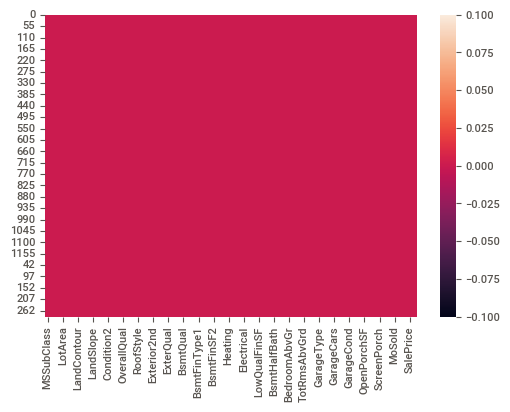

In [43]:
sns.heatmap(df_raw.isnull())

In [44]:
df_x=df_raw.drop(columns='SalePrice')
y=df_raw[['SalePrice']]
print(df_x.shape)
print(y.shape)

(1460, 73)
(1460, 1)


In [45]:
from sklearn.ensemble import ExtraTreesRegressor
import matplotlib.pyplot as plt
model = ExtraTreesRegressor()
model.fit(df_x,y)

ExtraTreesRegressor()

<AxesSubplot:>

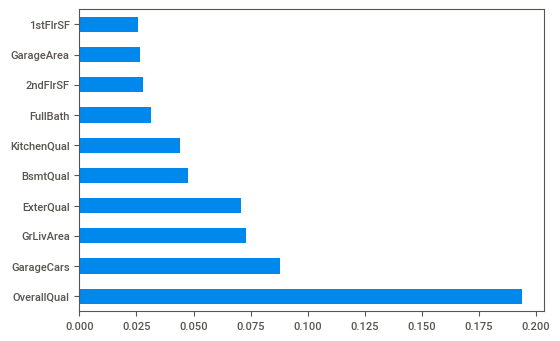

In [46]:
# Let's plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=df_x.columns)
feat_importances.nlargest(10).plot(kind='barh')

# PCA 

Text(0, 0.5, 'cumulative explained variance')

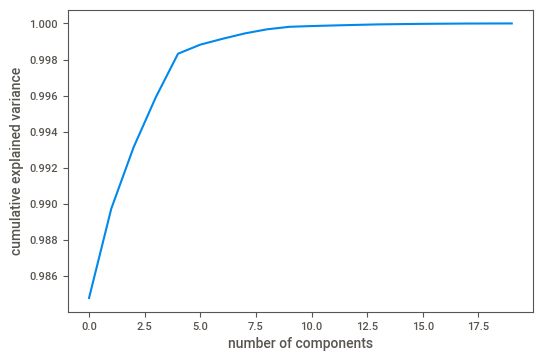

In [49]:
from sklearn.decomposition import PCA
pca = PCA().fit(df_x)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

In [51]:
pca = PCA(n_components =20)
df_x = pca.fit_transform(df_x)

In [52]:
df_x.shape

(1460, 20)

In [53]:
pca_x=pd.DataFrame(df_x)
pca_x

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-5601.710043,-354.043876,144.975882,-641.741162,59.208710,-186.261362,11.542666,44.386291,-69.967163,-58.242903,-130.935398,105.680184,-11.819138,-13.883967,66.564197,4.124268,-6.678449,28.966731,22.575525,-6.280986
1,5382.090209,1360.788021,452.195278,-744.065868,134.711574,665.259778,422.711501,580.552427,-48.634657,-127.083574,-144.924272,11.543063,60.082946,136.177159,7.252957,-28.033832,-2.178750,16.270065,8.699517,-14.141173
2,-584.290008,453.259185,-213.029880,721.911311,-143.631622,-103.707493,170.899782,-48.517541,-125.280384,68.237865,-61.407975,25.287314,-29.521078,-11.023741,-17.520234,-10.562085,3.041211,-21.327760,18.866966,-4.841055
3,1257.814412,1040.032894,534.825268,-572.270329,102.806942,-40.046873,-39.262852,-81.862508,281.822473,-127.096557,-40.054426,41.519390,-19.260829,-21.853557,-25.768414,3.063123,-15.692938,19.888253,18.508037,-2.136748
4,6136.475452,453.701005,904.697015,236.555923,-37.548253,-62.344559,59.895488,-90.988001,-27.915613,114.146863,37.400700,-36.611597,-3.930686,-9.482769,-22.168909,-11.219154,-7.247898,0.490710,-14.004202,12.257785
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,-302.706829,627.700196,56.297823,-1136.059128,154.290892,-84.444704,-314.651579,95.968951,192.582532,26.297471,-26.262386,38.813332,0.651221,-12.212482,-12.081905,10.202125,-3.015670,-11.695779,-3.469434,5.197785
1456,-1279.726709,-456.869136,532.956734,92.120655,-53.325613,-139.586712,-181.353281,68.087865,-184.794637,-92.933291,20.972176,-33.910779,0.477049,-21.507082,-23.804599,5.356902,-2.082721,-21.602200,-17.396070,0.508839
1457,716.052518,-515.343414,410.907799,51.782310,651.474390,-147.930984,-121.663844,13.954016,69.375849,-80.319204,17.049779,-23.104223,0.442975,-20.296298,-34.051196,8.735727,-10.298842,7.087325,-3.380755,-5.023283
1458,-5516.121386,158.011722,-306.720384,147.469611,-60.066161,-100.493593,127.155548,-32.064478,-82.212525,-80.434743,35.171176,-19.610345,-17.676536,-1.750485,-22.007273,-2.909194,-16.354657,34.566457,-17.861583,-22.397509


In [54]:
import numpy as np
for index in pca_x.skew().index:
    if pca_x.skew().loc[index]>0.5:
        pca_x[index]=np.cbrt(pca_x[index])
    if pca_x.skew().loc[index]<-0.5:
        pca_x[index]=np.square(pca_x[index])
print(pca_x.skew())
print("Total count of numeric features: ",len(pca_x.skew()))
print("count of features which are significantly skewed: ",len(pca_x.skew().loc[abs(pca_x.skew())>0.5]))

0     0.778898
1     0.242494
2    -0.011597
3    -0.456677
4     1.364872
5     0.941696
6    -0.056169
7     0.348058
8     0.269808
9     0.382081
10    0.256169
11    0.604577
12    1.396396
13    1.069865
14    1.011201
15    0.328535
16    0.706369
17    0.183014
18    0.299674
19    0.532808
dtype: float64
Total count of numeric features:  20
count of features which are significantly skewed:  9


In [55]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
sc.fit(pca_x)
x=sc.transform(pca_x)
x=pd.DataFrame(x,columns=pca_x.columns)

In [56]:
x

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-1.018805,-0.828844,0.247604,-1.210892,1.367293,-0.860420,0.063779,0.904774,-0.814775,-0.763243,-2.024243,1.622135,-0.473270,-0.514891,1.759116,0.915020,-0.732764,1.196703,1.400857,-0.718406
1,1.509769,1.505114,0.772304,-1.403968,1.663305,2.084404,2.335675,1.975277,-0.711522,-1.027536,-2.240509,0.879127,2.002546,2.178829,1.010108,-1.417925,-0.432429,0.998024,1.046487,-0.996132
2,-0.345192,1.068050,-0.363833,1.362164,-0.833383,-0.653907,0.944300,-0.697766,-1.008592,1.064587,-0.949359,1.082407,-0.798104,-0.451409,-0.593662,-0.993834,0.972648,-0.964779,1.325293,-0.644079
3,1.027474,1.383022,0.913427,-1.079809,1.556903,-0.393499,-0.216945,-0.852670,1.528549,-1.027575,-0.619236,1.241235,-0.634216,-0.654905,-0.719767,0.838934,-1.050322,1.062898,1.317470,-0.448488
4,1.565899,1.068371,1.545131,0.446354,-0.378433,-0.504419,0.330950,-0.887382,-0.576182,1.240073,0.578210,-0.801017,-0.193620,-0.412529,-0.668649,-1.016244,-0.759416,0.352581,-1.010437,1.292845
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,-0.227260,1.181256,0.096151,-2.143614,1.720453,-0.590481,-1.738594,1.136132,1.357036,0.809177,-0.406013,1.218075,0.783575,-0.478989,-0.486594,1.199097,-0.508367,-0.778642,-0.597620,1.014968
1456,-0.524121,-0.909517,0.910236,0.173821,-0.478501,-0.753652,-1.002060,1.025783,-1.160508,-0.913207,0.324227,-0.775803,0.749436,-0.649604,-0.692516,0.988434,-0.422533,-0.969160,-1.093650,0.562455
1457,0.895029,-0.950074,0.701789,0.097707,2.516792,-0.774325,-0.672249,0.652139,0.991428,-0.863859,0.263587,-0.658800,0.741816,-0.630620,-0.821508,1.144144,-0.882477,0.771278,-0.591630,-0.654238
1458,-1.012290,0.775557,-0.523847,0.278258,-0.515203,-0.643906,0.702593,-0.592908,-0.864725,-0.864334,0.543742,-0.613193,-0.603996,-0.087264,-0.666227,-0.608560,-1.068085,1.265628,-1.104199,-1.190242


In [57]:

#to find random stat which gives maximum r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
def maxr2_score(regr,x,y):
    max_r_score=0
    for r_state in range(42,100):
        x_train, x_test, y_train, y_test = train_test_split(x, y,random_state = r_state,test_size=0.20)
        regr.fit(x_train,y_train)
        y_pred = regr.predict(x_test)
        r2_scr=r2_score(y_test,y_pred)
        print("r2 score corresponding to ",r_state," is ",r2_scr)
        if r2_scr>max_r_score:
            max_r_score=r2_scr
            final_r_state=r_state
    print("max r2 score corresponding to ",final_r_state," is ",max_r_score)
    return final_r_state

In [58]:
from sklearn.tree import DecisionTreeRegressor
dtr=DecisionTreeRegressor()
r_state=maxr2_score(dtr,x,y)

r2 score corresponding to  42  is  0.22183176063651322
r2 score corresponding to  43  is  -0.023445494092359187
r2 score corresponding to  44  is  0.37351121230478956
r2 score corresponding to  45  is  -0.17362449884757702
r2 score corresponding to  46  is  0.2659858432478849
r2 score corresponding to  47  is  0.2610206704976741
r2 score corresponding to  48  is  0.26941450097442565
r2 score corresponding to  49  is  0.14120074165241714
r2 score corresponding to  50  is  0.101932253409734
r2 score corresponding to  51  is  0.2706727421708385
r2 score corresponding to  52  is  0.30881363102748116
r2 score corresponding to  53  is  0.2737447727984351
r2 score corresponding to  54  is  0.2694910974593753
r2 score corresponding to  55  is  0.2916182198469244
r2 score corresponding to  56  is  -0.0042583734830206055
r2 score corresponding to  57  is  0.004169202929167004
r2 score corresponding to  58  is  0.0639404935021034
r2 score corresponding to  59  is  -0.21043962144354067
r2 score co

In [59]:
#Lets chcek random forest
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
import warnings
warnings.filterwarnings("ignore")
rfr=RandomForestRegressor()
parameters = {"n_estimators":[10,100,500]}
clf = GridSearchCV(rfr, parameters, cv=5,scoring="r2")
clf.fit(x,y)
clf.best_params_

{'n_estimators': 500}

In [60]:
#lets chcek Random forest using n_estimators=500
from sklearn.ensemble import RandomForestRegressor
rfr=RandomForestRegressor(n_estimators=500)
#Lets chcek the cross_val_score for Random Forest Regressor
print("Random Forest Regressor\n\n")
r_state=maxr2_score(dtr,x,y)

Random Forest Regressor


r2 score corresponding to  42  is  0.1256944771372911
r2 score corresponding to  43  is  0.11796240103418065
r2 score corresponding to  44  is  0.3939842373755541
r2 score corresponding to  45  is  -0.32708627075853225
r2 score corresponding to  46  is  0.2185618696314815
r2 score corresponding to  47  is  0.24455767387822502
r2 score corresponding to  48  is  0.2063078287474046
r2 score corresponding to  49  is  0.12758525871897763
r2 score corresponding to  50  is  0.23780236331130777
r2 score corresponding to  51  is  0.29982534429235075
r2 score corresponding to  52  is  0.2724652400682478
r2 score corresponding to  53  is  0.28921704162445905
r2 score corresponding to  54  is  0.17373066882991262
r2 score corresponding to  55  is  0.25222453251502475
r2 score corresponding to  56  is  0.12830168269563968
r2 score corresponding to  57  is  0.07967466150617775
r2 score corresponding to  58  is  0.18865408357150493
r2 score corresponding to  59  is  -0.36613

In [61]:
#Lets chcek KNN regressor
from sklearn.neighbors import KNeighborsRegressor
knr=KNeighborsRegressor()
parameters = {"n_neighbors":range(2,30)}
clf = GridSearchCV(knr, parameters, cv=5,scoring="r2")
clf.fit(x, y)
clf.best_params_

{'n_neighbors': 11}

In [62]:
knr=KNeighborsRegressor(n_neighbors=11)
maxr2_score(knr,x,y)

r2 score corresponding to  42  is  0.3863910636340172
r2 score corresponding to  43  is  0.5415598807075834
r2 score corresponding to  44  is  0.3932494505553944
r2 score corresponding to  45  is  0.4446883518235667
r2 score corresponding to  46  is  0.36612030080643343
r2 score corresponding to  47  is  0.3955247737038191
r2 score corresponding to  48  is  0.4887627415098035
r2 score corresponding to  49  is  0.4562547971164147
r2 score corresponding to  50  is  0.5033571874612914
r2 score corresponding to  51  is  0.5208865996458901
r2 score corresponding to  52  is  0.42485019052907924
r2 score corresponding to  53  is  0.44742045363693395
r2 score corresponding to  54  is  0.5280973511077326
r2 score corresponding to  55  is  0.43086784931653965
r2 score corresponding to  56  is  0.44120954842794935
r2 score corresponding to  57  is  0.4376398505895255
r2 score corresponding to  58  is  0.48073277055443964
r2 score corresponding to  59  is  0.48339761122351665
r2 score correspondin

97

In [63]:
#lets chcek the SVM
from sklearn.svm import SVR
svr=SVR()
parameters={"kernel":["linear", "poly", "rbf"],"C":[0.001,0.01,0.1,1,10]}
clf = GridSearchCV(svr, parameters, cv=5,scoring="r2")
clf.fit(x,y)
clf.best_params_

{'C': 10, 'kernel': 'linear'}

In [64]:
svr=SVR(C=10,kernel="linear")
maxr2_score(svr,x,y)

r2 score corresponding to  42  is  0.07189262976938926
r2 score corresponding to  43  is  0.11470794166721565
r2 score corresponding to  44  is  0.07964025327892521
r2 score corresponding to  45  is  0.12867318061337785
r2 score corresponding to  46  is  0.11935122563420153
r2 score corresponding to  47  is  0.05153579617781967
r2 score corresponding to  48  is  0.1354143751758634
r2 score corresponding to  49  is  0.0880222308291807
r2 score corresponding to  50  is  0.10935757756894438
r2 score corresponding to  51  is  0.12031092504316032
r2 score corresponding to  52  is  0.10030925488241815
r2 score corresponding to  53  is  0.0911391549112599
r2 score corresponding to  54  is  0.12820347875415794
r2 score corresponding to  55  is  0.12379069312519897
r2 score corresponding to  56  is  0.1530864499260981
r2 score corresponding to  57  is  0.07257612051209461
r2 score corresponding to  58  is  0.1062557884174159
r2 score corresponding to  59  is  0.0753173009647834
r2 score corresp

96

In [63]:
from lazypredict.Supervised import LazyRegressor
reg=LazyRegressor(verbose=0,ignore_warnings=False, custom_metric=None)
model,predictions=reg.fit(x_train,x_test,y_train,y_test)
model.head(10)

100%|██████████| 42/42 [00:08<00:00,  4.75it/s]


,Adjusted R-Squared,R-Squared,RMSE,Time Taken
Model,,,,
RandomForestRegressor,0.57,0.60,48380.16,1.59
HistGradientBoostingRegressor,0.53,0.56,50345.39,0.71
BaggingRegressor,0.53,0.56,50488.80,0.18
LGBMRegressor,0.51,0.55,51192.35,0.34
ExtraTreesRegressor,0.51,0.54,51479.83,0.68
GradientBoostingRegressor,0.50,0.53,51894.99,0.81
AdaBoostRegressor,0.47,0.51,53387.25,0.29
OrthogonalMatchingPursuitCV,0.44,0.47,55140.07,0.04
PoissonRegressor,0.44,0.47,55149.41,0.03


In [66]:
#random forest and KNN are peforming almost equally good,but KNN is faster so we will choose KNN as our Final model
#knn is model
x_train, x_test, y_train, y_test = train_test_split(x, y,random_state = 77,test_size=0.20)
knr.fit(x_train,y_train)
y_pred=knr.predict(x_test)

In [67]:
print("RMSE is: ",np.sqrt(mean_squared_error(y_test,y_pred)))
print("r2_score is: ",r2_score(y_test,y_pred))

RMSE is:  56424.03777755245
r2_score is:  0.44953122353872144


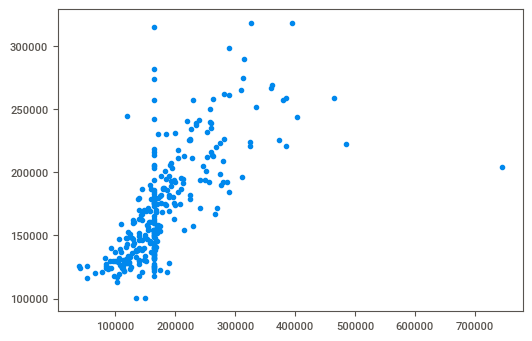

In [68]:
plt.scatter(y_test,y_pred)

In [69]:
#Lets save the model using joblib and pickle
import joblib
import pickle
joblib.dump(knr, 'rf_house_pred.obj')
pickle.dump(knr,open('rf_house_pred.pkl','wb'))